# The Sun
25.04.01 AstroLab


작성자: Seungwu Yoo, Lael Shin

## README

This notebook consists of three types of code cells:

The [Advanced] sections are dedicated to those who wish to further pursue and deeply study astronomy.

- [Mission]: Sections where you directly modify and manipulate values for practice.


- [Auto]: Sections that are not essential to manipulate for practice but are easy to understand.


- [Advanced]: Background information provided for practice; sections that you can execute without needing to fully understand or manipulate.

The [Advanced] sections are dedicated to those who wish to further pursue and deeply study astronomy.

### [Auto] Import the package

In [112]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

### [Auto] Adjust rcParams

If you have specific figure settings in mind, you can directly adjust the corresponding cell.

[cf] What is rcParams?
- These are runtime configuration parameters, abbreviated as rcparams.

- When using matplotlib, it's a way to set the default style of figures (e.g., fonts, axis line widths, etc.).

- Once you set an rcparam, that setting persists until the kernel (or the individual ipynb file) is restarted.

- Alternatively, you can directly specify the desired settings when calling the functions to plot graphs instead of setting rcparams.

- When settings are provided directly within a graphing function, those settings take precedence.

- reference: https://matplotlib.org/stable/users/explain/customizing.html#customizing-with-dynamic-rc-settings

- rcparam setting reference: Taewan Kim

In [108]:
plt.rcParams["font.family"] = 'STIXGeneral'
plt.rcParams['text.usetex'] = False
plt.rcParams["mathtext.fontset"] = 'cm'
plt.rcParams["axes.labelweight"] = "bold"

plt.rcParams.update({'xtick.direction': 'in'})
plt.rcParams.update({'ytick.direction': 'in'})
plt.rcParams.update({'lines.linewidth': 2})
plt.rcParams.update({'axes.linewidth': 8})
plt.rcParams.update({'axes.labelpad': 8})
plt.rcParams.update({'xtick.major.pad': 20})
plt.rcParams.update({'ytick.major.pad': 12})
plt.rcParams.update({'image.origin':'lower'})

def ax_tickandgrid(setting=True):
    if setting:
        plt.rcParams.update({'font.size': 60})
        plt.rcParams.update({'font.weight': 'normal'})
        plt.rcParams.update({'xtick.major.size': 40})
        plt.rcParams.update({'xtick.minor.size': 20})
        plt.rcParams.update({'ytick.major.size': 40})
        plt.rcParams.update({'ytick.minor.size': 20})
        plt.rcParams.update({'xtick.major.width': 2})
        plt.rcParams.update({'xtick.minor.width': 2})
        plt.rcParams.update({'ytick.major.width': 2})
        plt.rcParams.update({'ytick.minor.width': 2})
        plt.rcParams.update({"axes.grid" : True, "grid.color": "black"})
    else:
        plt.rcParams.update({'font.size': 20})
        plt.rcParams.update({'font.weight': 'normal'})
        plt.rcParams.update({'xtick.major.size': 0})
        plt.rcParams.update({'xtick.minor.size': 0})
        plt.rcParams.update({'ytick.major.size': 0})
        plt.rcParams.update({'ytick.minor.size': 0})
        plt.rcParams.update({'xtick.major.width': 0})
        plt.rcParams.update({'xtick.minor.width': 0})
        plt.rcParams.update({'ytick.major.width': 0})
        plt.rcParams.update({'ytick.minor.width': 0})
        plt.rcParams.update({"axes.grid" : False})
        
ax_tickandgrid()

## 1. The Period of the Solar Activity
### Goal: Measuring the solar activity cycle via changes in sunspot numbers.
#### Reference: https://www.sidc.be/SILSO/datafiles

### [Auto] Load the data

- Column 1,2,3: Year, Month, Date 

- Column 4 : Date in fraction of year 

- Column 5 : Number of sunspot (-1 indicates that no number is available for that day.) 

- Column 6: Daily standard deviation of the sunspot number 

- Column 7: Number of observations used to compute the daily sunspot number

In [6]:
data = np.genfromtxt('./SN_d_tot_V2.0.txt', usecols=range(7))

Date_in_frac = data[:, 3]       # Date in fraction of year
Num_spot = data[:, 4]           # Number of sunspot

### [Auto] Check the raw data
- You can change the style of the graph.

Text(0, 0.5, '$\\mathrm{N_{sunspot}}$')

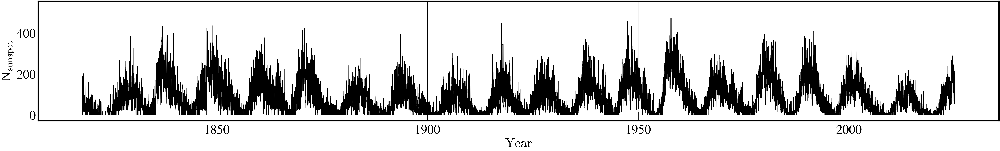

In [ ]:
ax_tickandgrid()

Date_cut = Date_in_frac[Num_spot > -1]
Num_spot_cut = Num_spot[Num_spot > -1]

fig = plt.figure(figsize=(80, 10))
ax = fig.add_subplot(1, 1, 1)

ax.plot(Date_cut, Num_spot_cut, color='black')
    
ax.set_xlabel('$\mathrm{Year}$')
ax.set_ylabel('$\mathrm{N_{sunspot}}$')

plt.show()

### [Advanced] Define the binning function

- Data binning divides raw data into intervals (bins) and defines a representative value for each bin to minimize random errors due to observations and facilitate data analysis.

- There are various methods for setting bins and defining representative values, and the choice can differ depending on the research purpose and the state of the data.

- In this notebook, we simply divide the "date" array (which represents days in terms of the 'year' unit) into equally spaced bins, and the date value and sunspot number for each bin are calculated as the average.

In [11]:
def date_binning(date_data, num_data, date_bin_size):
    date_bin = []
    num_bin = []
    current_min_date = date_data[0]
    current_date = []
    current_num = []
    
    for i, date in enumerate(date_data):
        if date < current_min_date + date_bin_size:
            current_date.append(date)
            current_num.append(num_data[i])
        else:
            date_avg = np.mean(current_date)
            num_avg = np.mean(current_num)
            date_bin.append(date_avg)
            num_bin.append(num_avg)
            
            current_date = [date]
            current_num = [num_data[i]]
            current_min_date = date
    
    return date_bin, num_bin

### [Auto] Plot the binned sunspot number as function of date

- You can change the date binning size (unit: year).

- You can also change the data binning method if necessary.

- Additionally, you can modify the style of the graph as desired.

Text(0, 0.5, '$\\mathrm{N_{sunspot}}$')

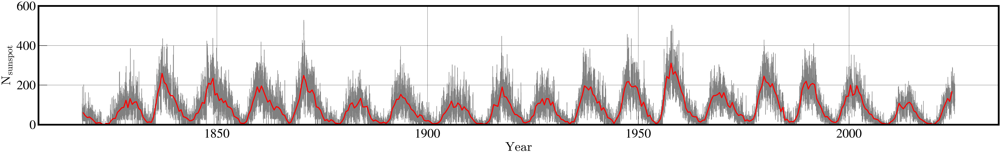

In [ ]:
Date_bin_size = 0.5         # You can change the binning size

Date_binned, Num_spot_binned = date_binning(Date_cut, Num_spot_cut, Date_bin_size)

ax_tickandgrid()

fig = plt.figure(figsize=(80, 10))
ax = fig.add_subplot(1, 1, 1)

ax.plot(Date_cut, Num_spot_cut, color='gray')
ax.plot(Date_binned, Num_spot_binned, color='red', linewidth=5)
    
ax.set_ylim(0, 600)

ax.set_xlabel('$\mathrm{Year}$')
ax.set_ylabel('$\mathrm{N_{sunspot}}$')

plt.show()

### [Mission 1] Find the sunspot number peak

- Find the date corresponding to the peak in the graph above and fill in the 'Max_date' list below.

Text(0, 0.5, '$\\mathrm{N_{sunspot}}$')

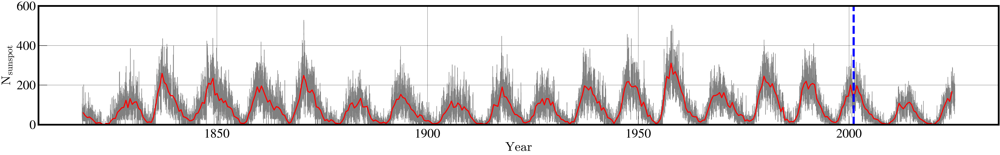

In [ ]:
Max_date = [2001.1220]          # fill the dates of peak

ax_tickandgrid()

fig = plt.figure(figsize=(80, 10))
ax = fig.add_subplot(1, 1, 1)

ax.plot(Date_cut, Num_spot_cut, color='gray')
ax.plot(Date_binned, Num_spot_binned, color='red', linewidth=5)

for date in Max_date:
    ax.vlines(date, 0, 600, color='blue', linestyles='--', linewidth=10)

ax.set_ylim(0, 600)

ax.set_xlabel('$\mathrm{Year}$')
ax.set_ylabel('$\mathrm{N_{sunspot}}$')

plt.show()

### [Auto] Investigate the period of the solar activity
- Before running the code, please locate and identify the dates corresponding to at least three consecutive peaks in the number values to accurately determine the peak dates. Once you have these dates, fill in the 'Max_date' list accordingly.

In [49]:
delta_date = []

for i in range(len(Max_date)-1):
    delta_date.append(Max_date[i+1] - Max_date[i])
    
if len(delta_date) > 2:
    print(f'The period of sunspot number peak is {np.mean(delta_date)} yr')
else:
    print("Please find more than three peaks")

Please find more than three peaks


### Additional Thinking (Not duty)
- Can alternative methods be used for data reduction besides the one employed in this notebook?

- What techniques can be leveraged to determine the periodicity of solar activity peaks?

## 2. The Rotation of Sunspots
### Goal: Understanding the solar rotation period through measurements of sunspot rotation speeds by latitude
#### Refernce: "sdo.gsfc.nasa.gov" 

### [Advanced] Check the images of Sun

- The SDO (Solar Dynamics Observatory) includes three instruments: AIA, EVE, and HMI, which respectively observe the solar atmosphere, ultraviolet, and magnetic activity.

- The images below are photographs of the Sun taken by SDO from March 12 to March 18, 2025.

- If you wish to use additional data beyond the provided images, please refer to https://sdo.gsfc.nasa.gov/data/aiahmi/.

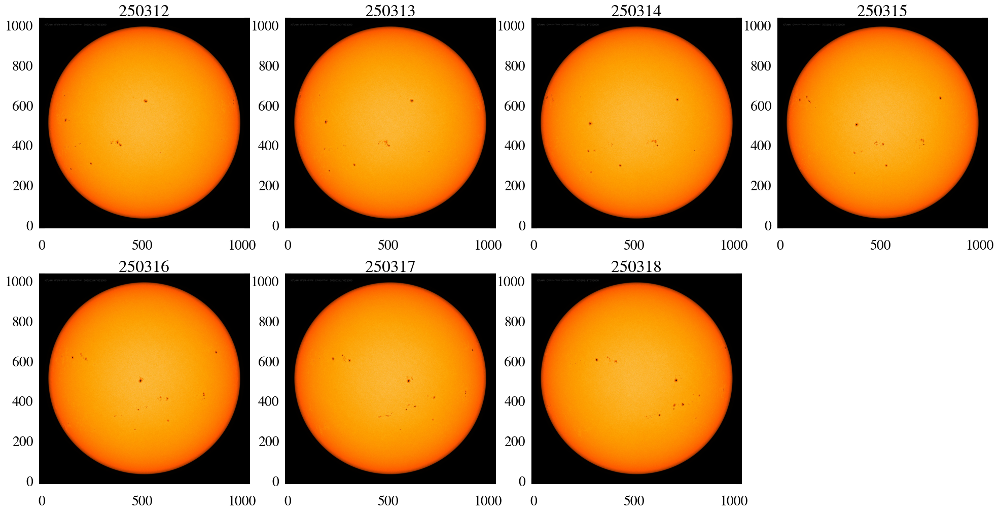

In [ ]:
file_list = ['20250312_023000_1024_HMIIC.jpg',
             '20250313_023000_1024_HMIIC.jpg',
             '20250314_023000_1024_HMIIC.jpg',
             '20250315_023000_1024_HMIIC.jpg',
             '20250316_023000_1024_HMIIC.jpg',
             '20250317_023000_1024_HMIIC.jpg',
             '20250318_023000_1024_HMIIC.jpg']

date_list = [250312, 250313, 250314, 250315, 250316, 250317, 250318]

ax_tickandgrid(False)

fig = plt.figure(figsize=(24,12))
for i in range(len(file_list)):
    image = mpimg.imread(str(file_list[i]))
    
    ax = fig.add_subplot(2, 4, i + 1)
    ax.imshow(image)
    ax.set_title(date_list[i])

plt.show()

### [Mission 2] Find the pixel radius and position of sunspots

- Below is an explanation of how you might adjust the parameters (edgey, ceny, cenz) to measure the pixel radius of the Sun in the March 12, 2025 image:
 
- Identify the arbitrary three sunspot positions in the March 12, 2025 solar image and then adjust the sp1_yz, sp2_yz, and sp3_yz values accordingly. 

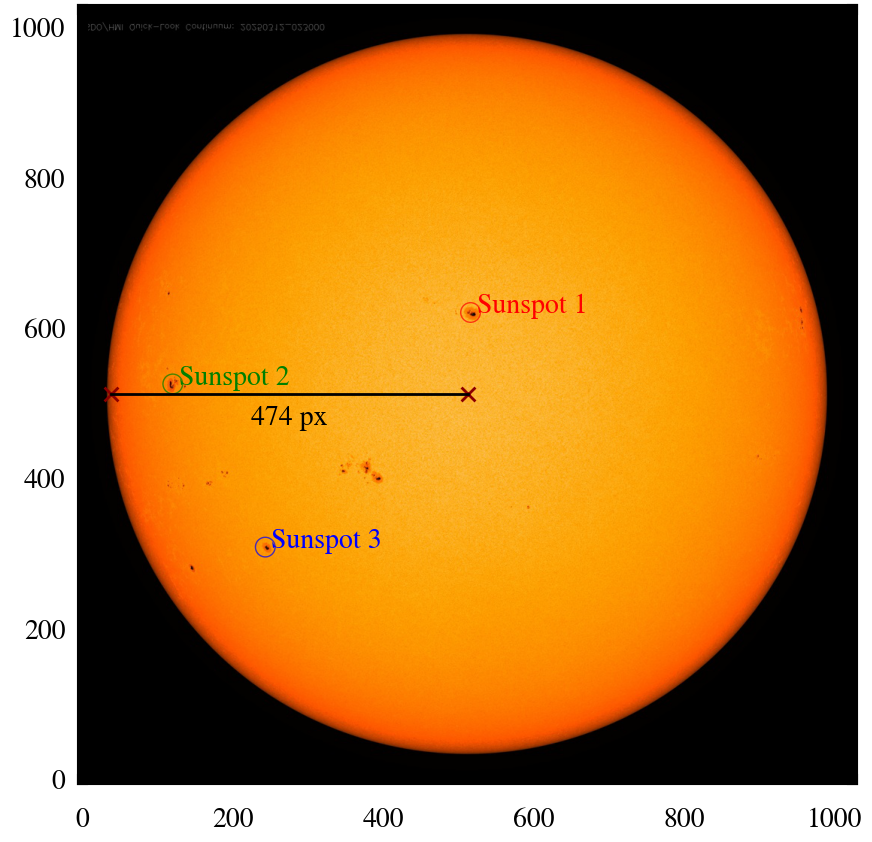

In [109]:
ax_tickandgrid(False)

image = mpimg.imread('20250312_023000_1024_HMIIC.jpg')
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(image)

edgey, ceny, cenz = 38, 512, 512        # Write the pixel value of edge, center of sun

ax.scatter([ceny], [cenz], marker='x', color='darkred', s=100) 
ax.scatter([edgey], [cenz], marker='x', color='darkred', s=100)
ax.plot([edgey, cenz], [ceny, cenz], color='black')
radius = ceny - edgey
ax.text((edgey + ceny) * 0.5, cenz - 40, f'{radius} px', ha='center')

sp1_yz = [516, 620]
sp2_yz = [120, 525]
sp3_yz = [243, 308]


ax.scatter([sp1_yz[0]],[sp1_yz[1]], marker='o', edgecolor='red', facecolor='none', 
            alpha=0.7, s=200) 
ax.text(sp1_yz[0] + 8, sp1_yz[1], 'Sunspot 1', color='red')

ax.scatter([sp2_yz[0]],[sp2_yz[1]], marker='o', edgecolor='green', facecolor='none', 
            alpha=0.7, s=200) 
ax.text(sp2_yz[0] + 8, sp2_yz[1], 'Sunspot 2', color='green')

ax.scatter([sp3_yz[0]],[sp3_yz[1]], marker='o', edgecolor='blue', facecolor='none', 
            alpha=0.7, s=200) 
ax.text(sp3_yz[0] + 8, sp3_yz[1], 'Sunspot 3', color='blue')

plt.show()

### [Mission 3] Iterating mission 2

- Please verify the positions of three sunspots in the solar images from March 12 to March 18, 2025, and adjust the values of sp(1,2,3)_yz_dict accordingly.

- For a detailed explanation of the dictionary ({}) data type, please refer to the reference below.

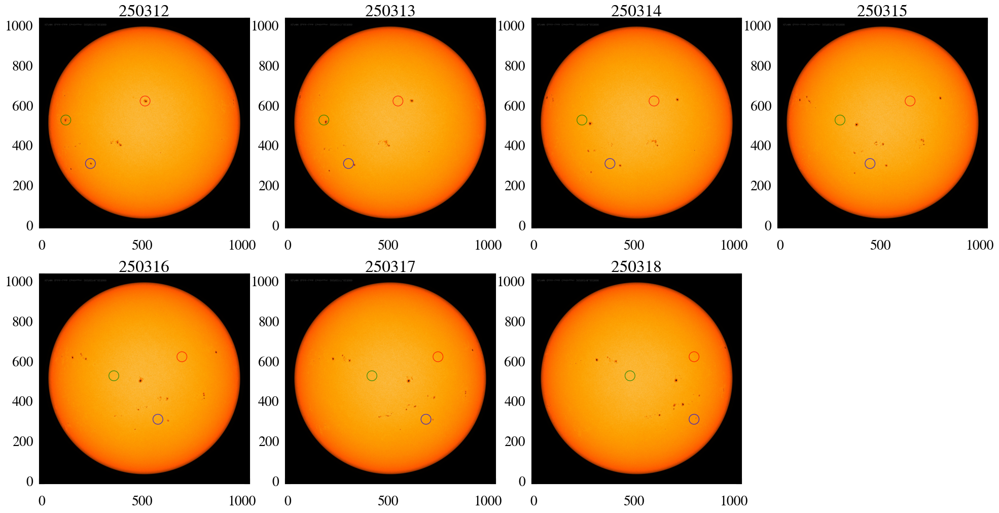

In [ ]:
# You must fix thses values
sp1_yz_dict = {250312: [516, 620], 
               250313: [550, 620],
               250314: [600, 620],
               250315: [650, 620],
               250316: [700, 620],
               250317: [750, 620],
               250318: [800, 620]}

sp2_yz_dict = {250312: [120, 525], 
               250313: [180, 525],
               250314: [240, 525],
               250315: [300, 525],
               250316: [360, 525],
               250317: [420, 525],
               250318: [480, 525]}

sp3_yz_dict = {250312: [243, 308], 
               250313: [303, 308],
               250314: [380, 308],
               250315: [450, 308],
               250316: [580, 308],
               250317: [690, 308],
               250318: [800, 308]}

ax_tickandgrid(False)

fig = plt.figure(figsize = (24,12))
for i in range(len(file_list)):
    image = mpimg.imread(str(file_list[i]))
    
    ax = fig.add_subplot(2, 4, i + 1)
    ax.imshow(image)
    ax.set_title(date_list[i])
    
    sp1_yz = sp1_yz_dict[date_list[i]]
    if len(sp1_yz) == 2:
        ax.scatter([sp1_yz[0]],[sp1_yz[1]], marker='o', edgecolor='red', facecolor='none', 
            alpha=0.7, s=200) 
    sp2_yz = sp2_yz_dict[date_list[i]]
    if len(sp2_yz) == 2:
        ax.scatter([sp2_yz[0]],[sp2_yz[1]], marker='o', edgecolor='green', facecolor='none', 
            alpha=0.7, s=200) 
    sp3_yz = sp3_yz_dict[date_list[i]]
    if len(sp3_yz) == 2:
        ax.scatter([sp3_yz[0]], [sp3_yz[1]], marker='o', edgecolor='blue', facecolor='none', 
            alpha=0.7, s=200) 
        
plt.show()

#### [참고] dictionary ({}) data type
- Python supports the Dictionary data type. The features of a Dictionary are as follows:

    1. A Dictionary is defined using curly braces {}.
    > Astrolab = {}

    > Astrolab
    >> {}
    2. You can include key-item pairs when defining a Dictionary.
    > Astrolab = {'TA':'SeungwuYoo', 'Prof':'JubeeSohn'}
    
    > Astrolab
    >> {'TA':'SeungwuYoo', 'Prof':'JubeeSohn'}
    3. When you input a key into the Dictionary, it returns the corresponding item.
    > Astrolab['TA']
    >>'SeungwuYoo'
    
    > Astrolab['Prof']
    >>'JubeeSohn'
    4. Even if you do not include key-item pairs when defining the Dictionary, you can add them later.
    > Astrolab['Time']='15:30'

    > Astrolab
    >> {'TA':'SeungwuYoo', 'Prof':'JubeeSohn', 'Time':'15:30'}
    5. Both the key and the item of a Dictionary can be of any data type, and they do not have to be of the same type.
    > Astrolab['Student_Num'] = 60

    > Astrolab
    >> {'TA':'SeungwuYoo', 'Prof':'JubeeSohn', 'Time':'15:30', 'Student_Num':60}

    6. If you try to input a key that does not exist in the Dictionary, an error will occur.
    > Astrolab['pay']
    >> 'KeyError': 'pay'

### [Auto] Converting the Cartesian coordinates to the spherical coordinates

- spherical coordinates:  https://en.wikipedia.org/wiki/Spherical_coordinate_system

-  $\rm{\phi = sgn(y) \, arccos (x/\sqrt{x^2 + y^2})}$

-  $\rm{r^2 = x^2 + y^2 + z^2}$

-  $\rm{\therefore \, \phi = sgn(y) \, arccos \frac{\sqrt{r^2-y^2-z^2}}{\sqrt{r^2 - z^2}}}$

-  $\rm{\theta = arccos (z/r)}$

-  $\rm{\theta_{equator=0^\circ} = |\pi/2 - arccos (z/r)|}$

In [85]:
def cartesian_to_spherical_phi(radius, y, z):
    sgn_y = y / np.abs(y)
    phi = sgn_y*np.arccos(np.sqrt(radius**2 - y**2 - z**2) / np.sqrt(radius**2 - z**2))
    return phi

def cartesian_to_spherical_theta_equator(radius, z):
    theta = np.arccos(z / radius)
    theta_eq = abs(np.pi / 2 - theta)
    return theta_eq

phi_list_sp1, phi_list_sp2, phi_list_sp3 = [], [], []
theta_list_sp1, theta_list_sp2, theta_list_sp3 = [], [], []

for i in range(len(file_list)):
    sp1_yz = sp1_yz_dict[date_list[i]]
    y, z = sp1_yz[0] - ceny, sp1_yz[1] - cenz
    
    phi = cartesian_to_spherical_phi(radius, y, z)
    phi_list_sp1.append(phi)
    theta = cartesian_to_spherical_theta_equator(radius, z)
    theta_list_sp1.append(theta)
    
    sp2_yz = sp2_yz_dict[date_list[i]]
    y, z = sp2_yz[0] - ceny, sp2_yz[1] - cenz
    
    phi = cartesian_to_spherical_phi(radius, y, z)
    phi_list_sp2.append(phi)
    theta = cartesian_to_spherical_theta_equator(radius, z)
    theta_list_sp2.append(theta)
    
    sp3_yz = sp3_yz_dict[date_list[i]]
    y, z = sp3_yz[0] - ceny, sp3_yz[1] - cenz
    
    phi = cartesian_to_spherical_phi(radius, y, z)
    phi_list_sp3.append(phi)
    theta = cartesian_to_spherical_theta_equator(radius, z)
    theta_list_sp3.append(theta)
    
phi_list_sp1 = np.array(phi_list_sp1) * 180 / np.pi
phi_list_sp2 = np.array(phi_list_sp2) * 180 / np.pi
phi_list_sp3 = np.array(phi_list_sp3) * 180 / np.pi

### [Auto] Plot the figures of Time-Phi, Period-Theta

- You can change the style of the graph.

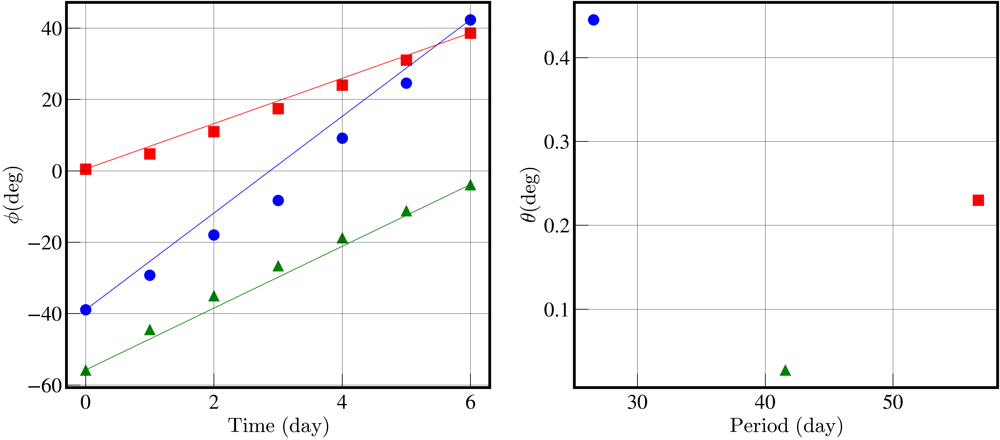

In [103]:
ax_tickandgrid()

fig = plt.figure(figsize = (48,20))
ax1, ax2 = fig.add_subplot(1, 2, 1), fig.add_subplot(1, 2, 2)

slope1 = (max(phi_list_sp1) - min(phi_list_sp1)) / (len(phi_list_sp1) - 1)
time_array = np.array(range(len(date_list)))
ax1.scatter(time_array, phi_list_sp1, color='red', marker='s', s=1000)
ax1.plot(time_array, slope1*time_array + min(phi_list_sp1), color = 'red')
theta1 = np.mean(theta_list_sp1)
ax2.scatter(360 / slope1, theta1, color='red', marker='s', s=1000)


slope2 = (max(phi_list_sp2) - min(phi_list_sp2)) / (len(phi_list_sp2) -1)
time_array = np.array(range(len(date_list)))
ax1.scatter(time_array, phi_list_sp2, color='green', marker='^', s=1000)
ax1.plot(time_array, slope2*time_array + min(phi_list_sp2), color = 'green')
theta2 = np.mean(theta_list_sp2)
ax2.scatter(360 / slope2, theta2, color='green', marker='^', s=1000)


slope3 = (max(phi_list_sp3) - min(phi_list_sp3)) / (len(phi_list_sp3) -1)
time_array = np.array(range(len(date_list)))
ax1.scatter(time_array, phi_list_sp3, color='blue', marker='o', s=1000)
ax1.plot(time_array, slope3*time_array + min(phi_list_sp3), color = 'blue')
theta3 = np.mean(theta_list_sp3)
ax2.scatter(360 / slope3, theta3, color='blue', marker='o', s=1000)

ax1.set_xlabel('$\mathrm{Time\ (day)}$')
ax1.set_ylabel('$\mathrm{\phi (deg)}$')
ax2.set_xlabel('$\mathrm{Period\ (day)}$')
ax2.set_ylabel('$\mathrm{\\theta (deg)}$')

plt.show()

### Additional Thinking (Not duty)

- What would happen if we conducted experiments on sunspots at a wider range of latitudes?

- Are there any other methods for measuring the phi-time slope of sunspots?

- Why can the different rotation periods of sunspots measured at various latitudes be considered evidence that the Sun's surface is fluid? Could aliens, when measuring Earth, also claim that "Earth is fluid" based on the turbulent motion in its atmosphere?

## Bonus. Atmosphere of the sun with various channels
#### Reference: https://sdo.gsfc.nasa.gov/data/channels.php

### [Advanced] Check the images with various channel

- For information on each channel, please refer to the link at the top.

- Each image was taken by a different channel of SDO's AIA instrument, observing the Sun around 3:00 AM (US time) on March 12, 2025.

- The HMI sunspot image was generally captured approximately 40 minutes later.

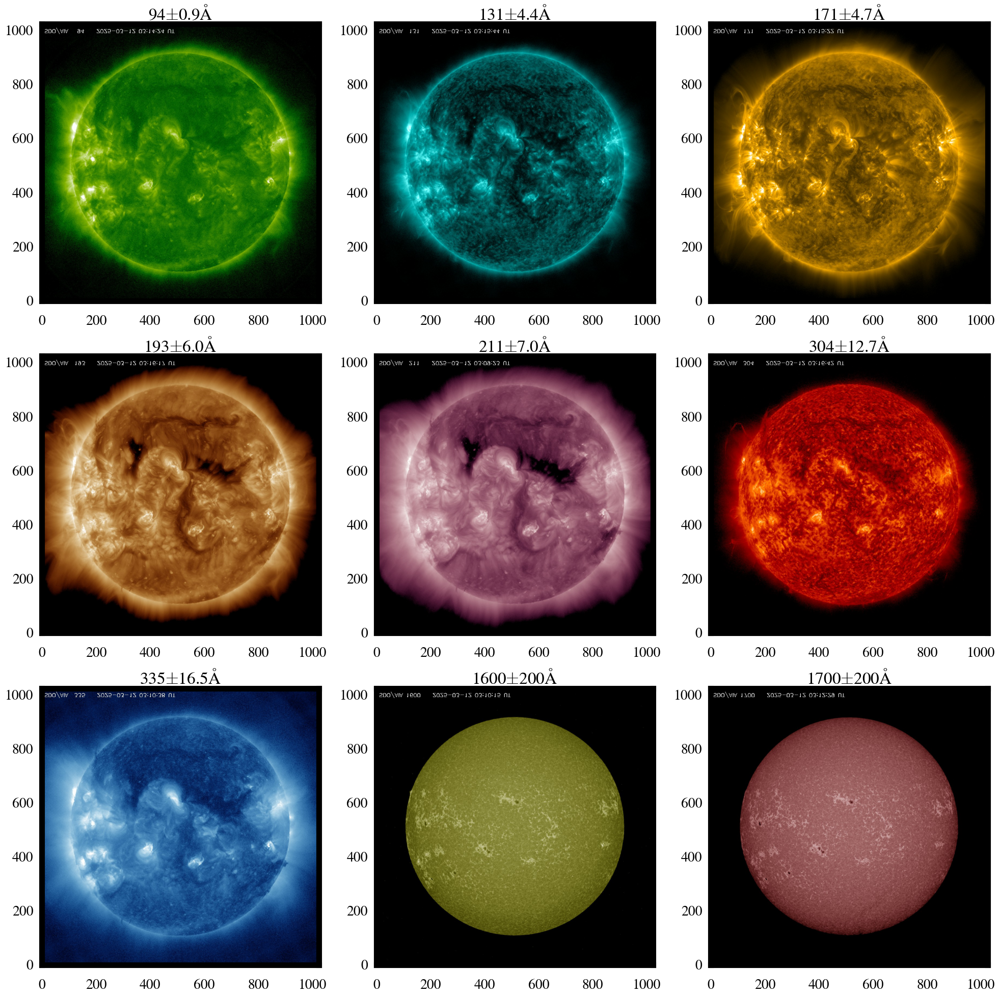

In [ ]:
file_list = ['20250312_031424_1024_0094.jpg',
             '20250312_031544_1024_0131.jpg',
             '20250312_031522_1024_0171.jpg',
             '20250312_031617_1024_0193.jpg',
             '20250312_030923_1024_0211.jpg',
             '20250312_031642_1024_0304.jpg',
             '20250312_031038_1024_0335.jpg',
             '20250312_031015_1024_1600.jpg',
             '20250312_031229_1024_1700.jpg',]

band_list = [94, 131, 171, 193, 211, 304, 335, 1600, 1700]
fwhm_list = [0.9, 4.4, 4.7, 6.0, 7.0, 12.7, 16.5, 200, 200]

ax_tickandgrid(False)

fig = plt.figure(figsize=(24, 24))
for i in range(len(file_list)):
    image = mpimg.imread(str(file_list[i]))
    
    ax = fig.add_subplot(3, 3, i + 1)
    ax.imshow(image, origin='lower')
    ax.set_title(f'{band_list[i]}$\pm${fwhm_list[i]}$\mathrm{{\AA}}$')
    
plt.show()


### [Auto] Compare the position of sunspot

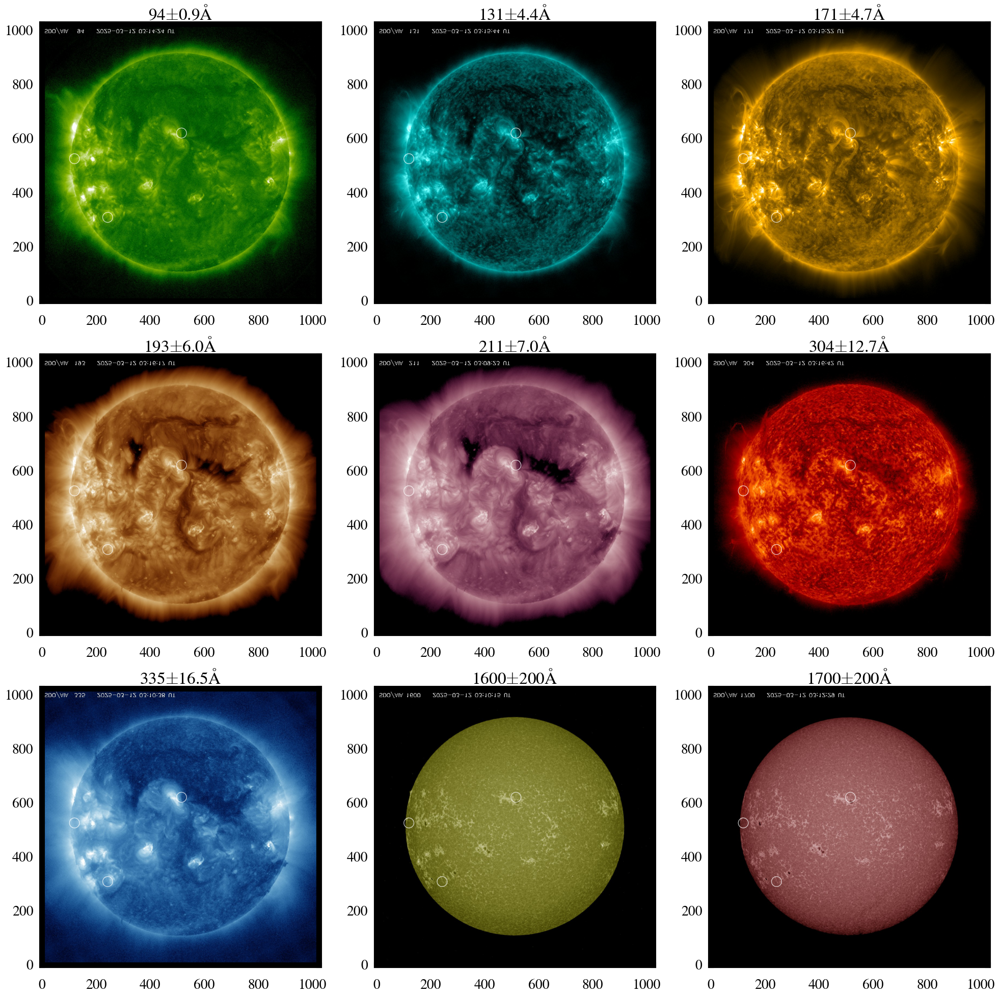

In [110]:
ax_tickandgrid(False)

fig = plt.figure(figsize=(24, 24))
for i in range(len(file_list)):
    image = mpimg.imread(str(file_list[i]))
    
    ax = fig.add_subplot(3, 3, i + 1)
    ax.imshow(image, origin='lower')
    ax.set_title(f'{band_list[i]}$\pm${fwhm_list[i]}$\mathrm{{\AA}}$')
    
    ax.scatter([sp1_yz[0]],[sp1_yz[1]], marker='o', edgecolor='white', facecolor='none', 
            alpha=0.7, s=200) 
    ax.scatter([sp2_yz[0]],[sp2_yz[1]], marker='o', edgecolor='white', facecolor='none', 
            alpha=0.7, s=200) 
    ax.scatter([sp3_yz[0]],[sp3_yz[1]], marker='o', edgecolor='white', facecolor='none', 
            alpha=0.7, s=200) 
    
    
plt.show()
